In [17]:
import os, sys
from glob import glob
import numpy as np
import dask
import xarray as xr
import xgcm
from scipy.signal import welch
from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from mitequinox.sigp import *
from mitequinox.plot import *

In [18]:
from dask_jobqueue import PBSCluster
# for heavy processing:
cluster = PBSCluster(cores=6, processes=6, walltime='02:00:00')
w = cluster.scale(6*10)

In [19]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [20]:
client

Client Scheduler: tcp://10.135.39.29:45167 Dashboard: http://10.135.39.29:8787/status,Cluster Workers: 60 Cores: 60 Memory: 1.00 TB


__________
# Read (face$*$i$*$j)

In [21]:
Tau_H_rms = xr.open_zarr('/work/ALT/swot/aval/syn/xy/momentum_balance/data/TAU_H_rms.zarr')
Tau_H_rms = Tau_H_rms.ds_TAU_H
Tau_H_rms

<xarray.DataArray 'ds_TAU_H' (face: 13, j: 1080, i: 1080)>
dask.array<zarr, shape=(13, 1080, 1080), dtype=float32, chunksize=(1, 108, 108), chunktype=numpy.ndarray>
Coordinates:
    Depth    (face, j, i) float32 dask.array<chunksize=(4, 270, 270), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(4, 270, 270), meta=np.ndarray>
    YC       (face, j, i) float32 dask.array<chunksize=(4, 270, 270), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

In [22]:
Tau_ELD_rms = xr.open_zarr('/work/ALT/swot/aval/syn/xy/momentum_balance/data/TAU_ELD_rms.zarr')
Tau_ELD_rms = Tau_ELD_rms.oceTAUX_ELD_rms + Tau_ELD_rms.oceTAUY_ELD_rms
Tau_ELD_rms

<xarray.DataArray (face: 13, j: 1080, i: 1080)>
dask.array<add, shape=(13, 1080, 1080), dtype=float32, chunksize=(1, 108, 108), chunktype=numpy.ndarray>
Coordinates:
    CS       (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    Depth    (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    SN       (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    XC       (face, j, i) float32 -114.93228 -114.93183 ... -114.52893
    YC       (face, j, i) float32 -88.17715 -88.18883 ... -88.16518 -88.165405
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    rA       (face, j, i) float32 155492.97 155533.44 ... 155872.25 155612.52

### $E_{ageo}$

In [23]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv_all/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_ageo_all = xr.concat(D, dim='face')
E_ageo_all = ds_ageo_all.E_all
E_ageo_high_all = ds_ageo_all.E_high

In [24]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_ageo = xr.concat(D, dim='face')
E_ageo = ds_ageo.E_all
E_ageo_high = ds_ageo.E_high

# 3. Global figures

In [25]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

In [26]:
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
dij=4 
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij)) 
ice

<xarray.DataArray 'AREA' (face: 13, j: 1080, i: 1080)>
dask.array<getitem, shape=(13, 1080, 1080), dtype=float64, chunksize=(1, 1080, 1080), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

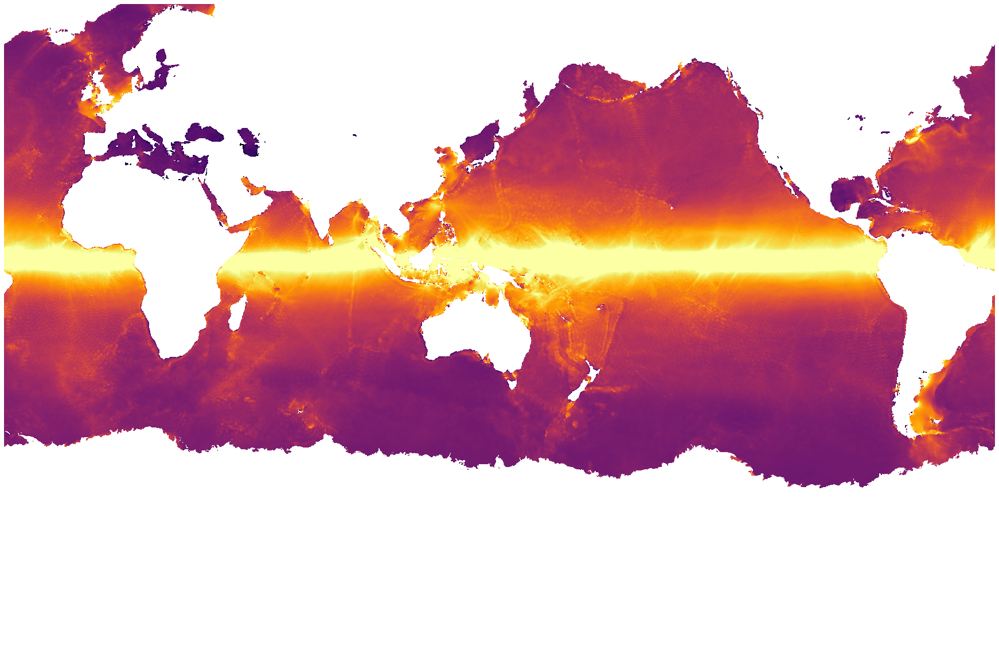

In [11]:
quick_llc_plot(np.log10(E_ageo.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

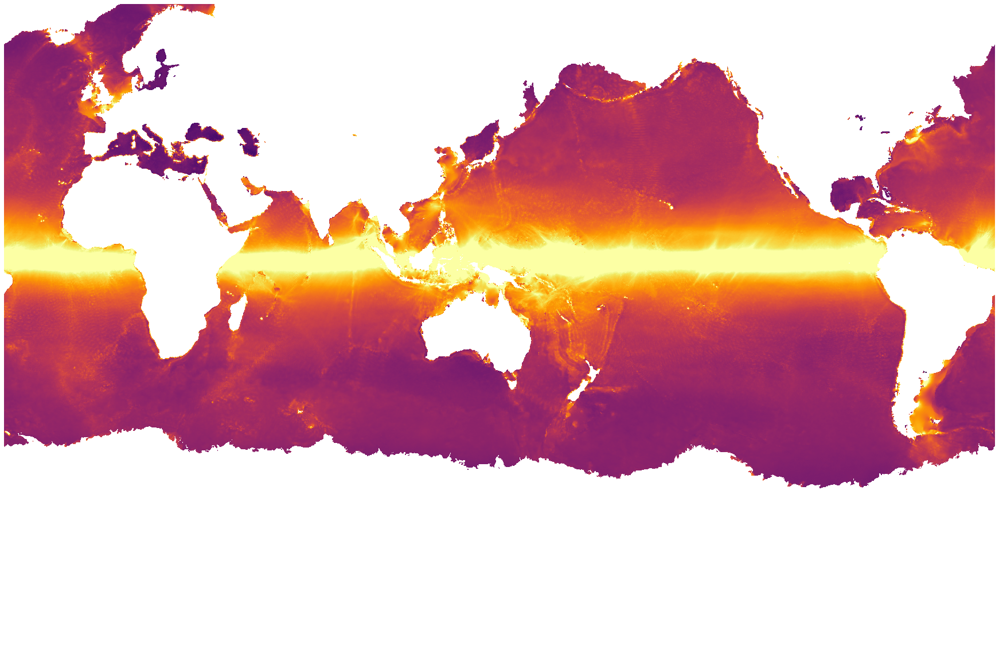

In [12]:
quick_llc_plot(np.log10(E_ageo_all.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

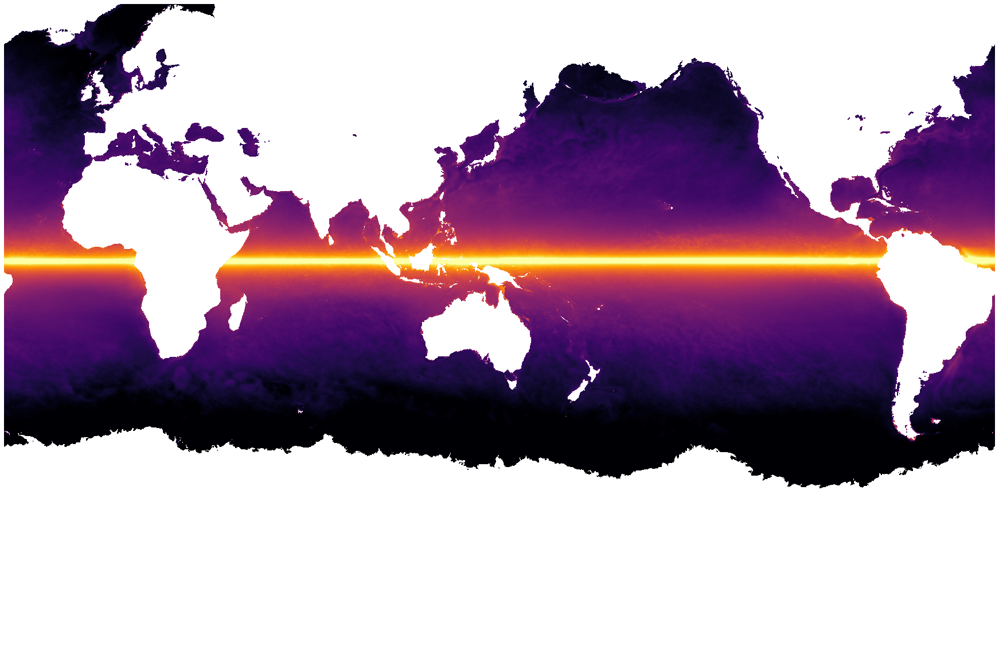

In [35]:
quick_llc_plot(np.log10(Tau_H_rms.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

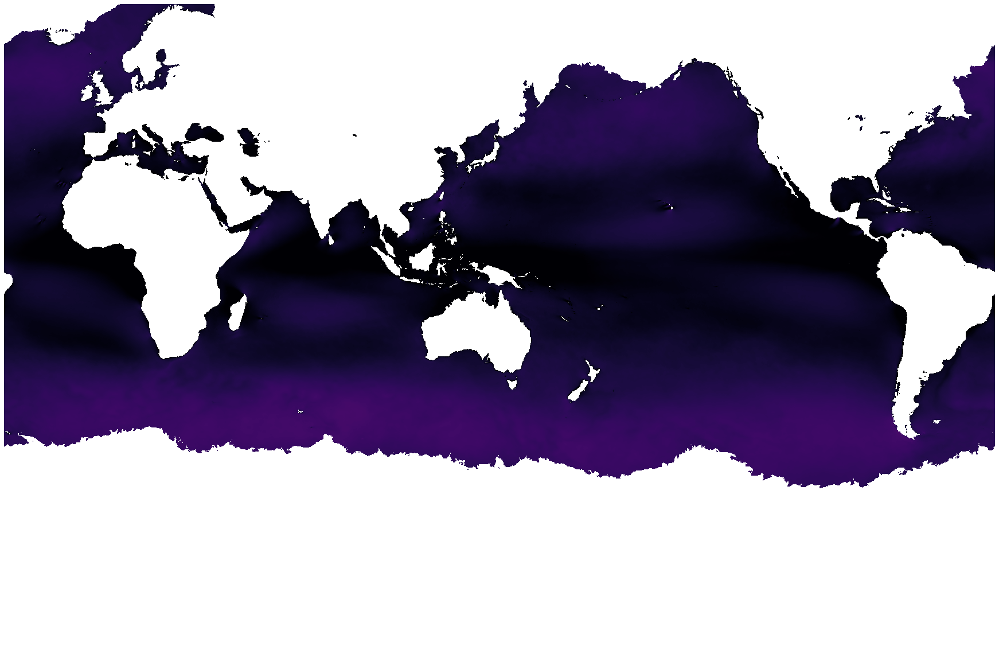

In [36]:
quick_llc_plot(np.log10(Tau_ELD_rms.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

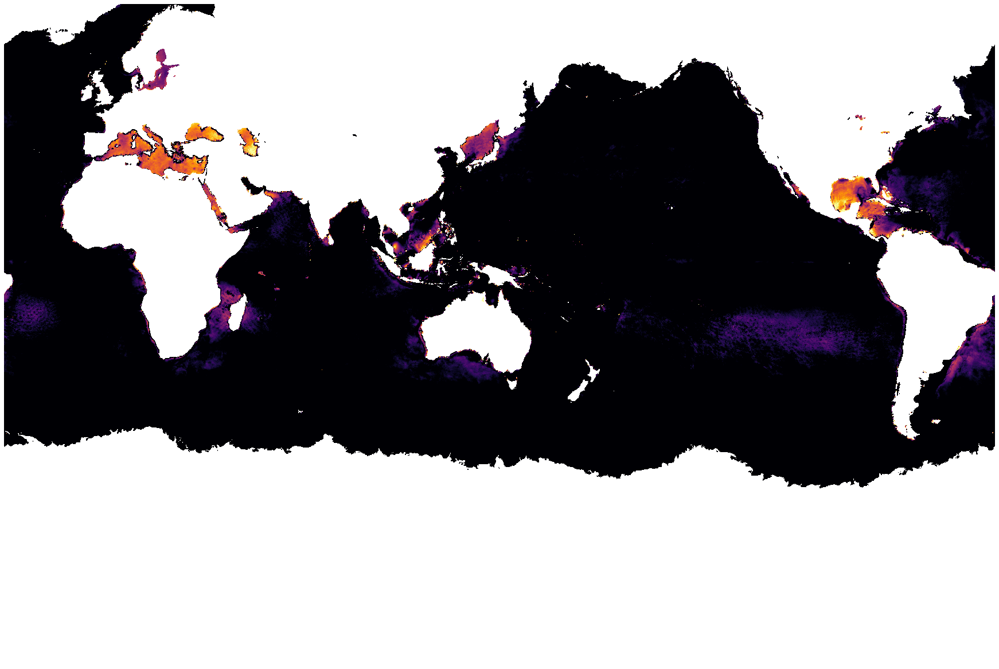

In [15]:
quick_llc_plot(np.log10(Tau_H_rms.where(ice>0)/E_ageo_all.where(ice>0)), vmin=-1, vmax=0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

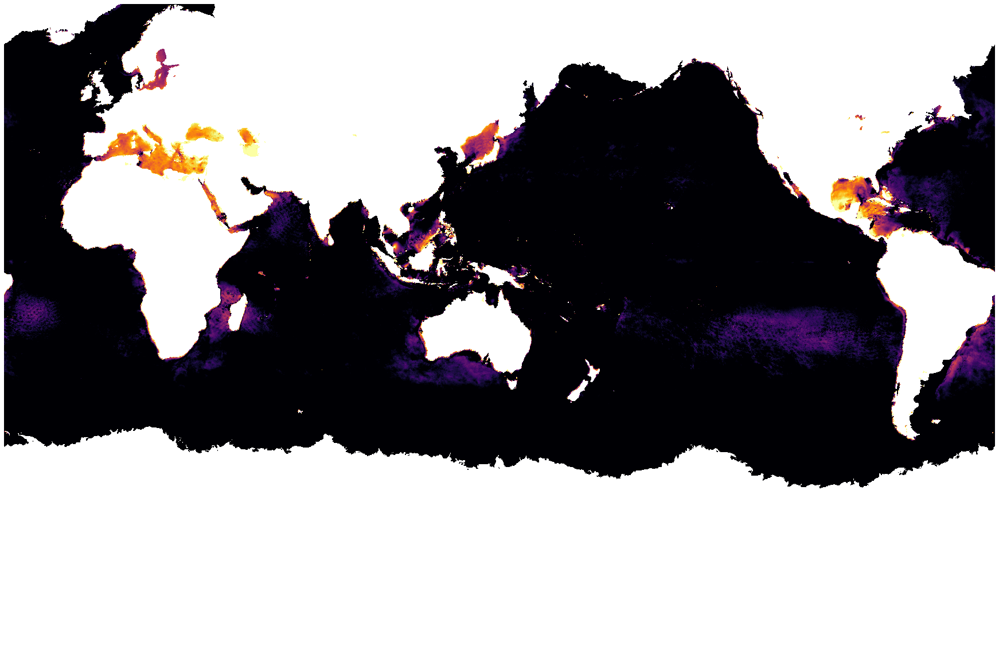

In [22]:
quick_llc_plot(np.log10(Tau_H_rms.where(ice>0)/E_ageo.where(ice>0)), vmin=-1, vmax=0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

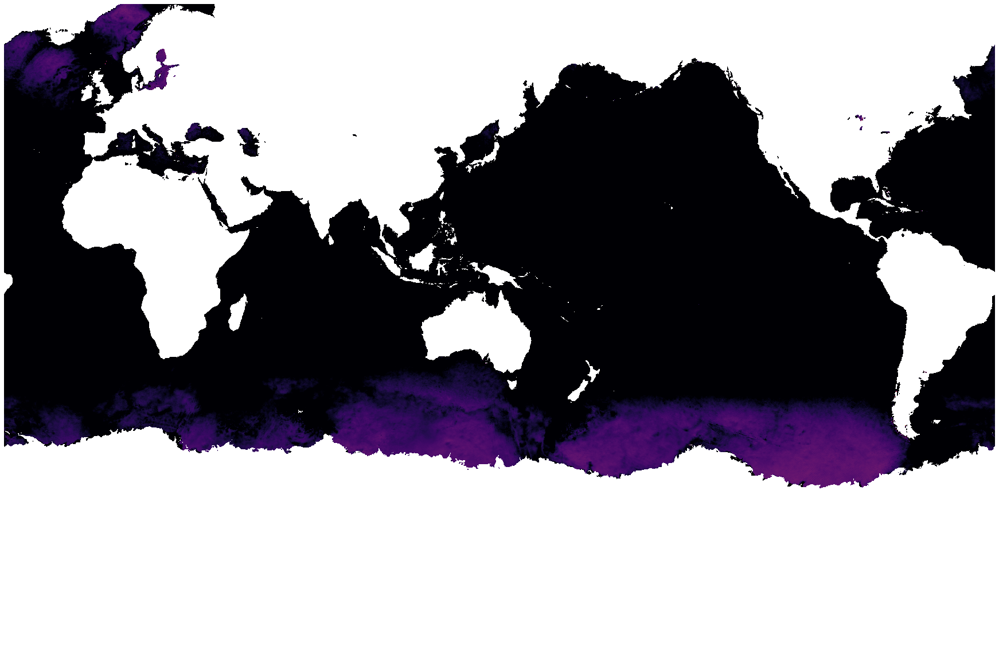

In [18]:
quick_llc_plot(np.log10(Tau_ELD_rms.where(ice>0)/E_ageo_all.where(ice>0)), vmin=-1, vmax=0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

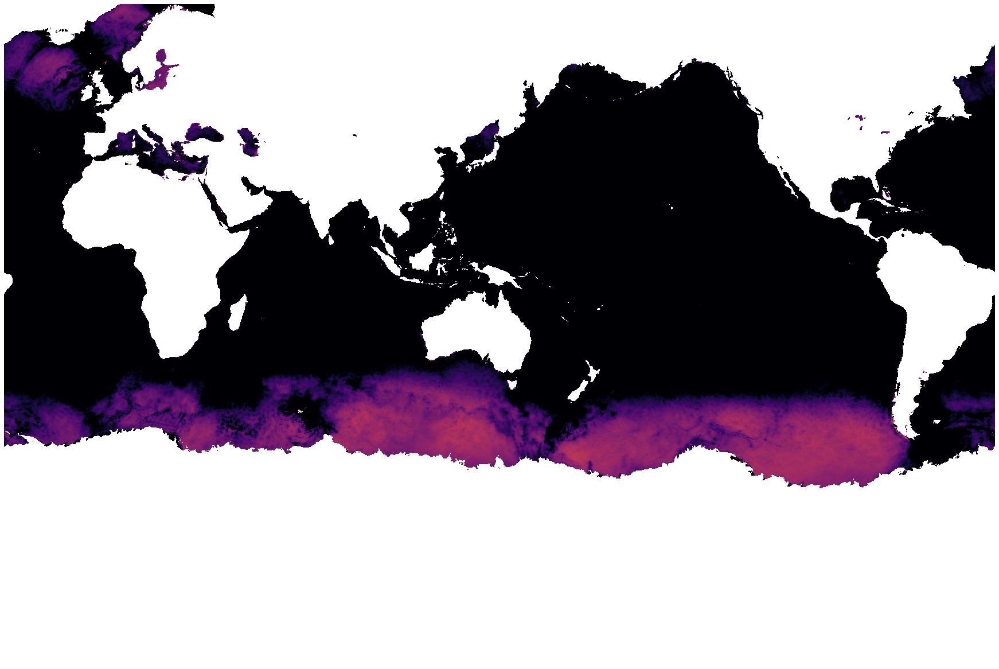

In [21]:
quick_llc_plot(np.log10(Tau_ELD_rms.where(ice>0)/E_ageo.where(ice>0)), vmin=-1, vmax=0, add_colorbar=False, axis_off=True, cmap='inferno')

In [27]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/1_time_term/E_omega_f%02d.zarr'%(face)) for face in face_all] 
ds_omega = xr.concat(D, dim='face')
print(ds_omega)

<xarray.Dataset>
Dimensions:      (face: 13, i: 1080, j: 1080)
Coordinates:
  * i            (i) int64 0 4 8 12 16 20 24 ... 4296 4300 4304 4308 4312 4316
  * j            (j) int64 0 4 8 12 16 20 24 ... 4296 4300 4304 4308 4312 4316
    Depth        (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    XC           (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    YC           (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxC          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxG          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyC          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyG          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_i          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_j          (face

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

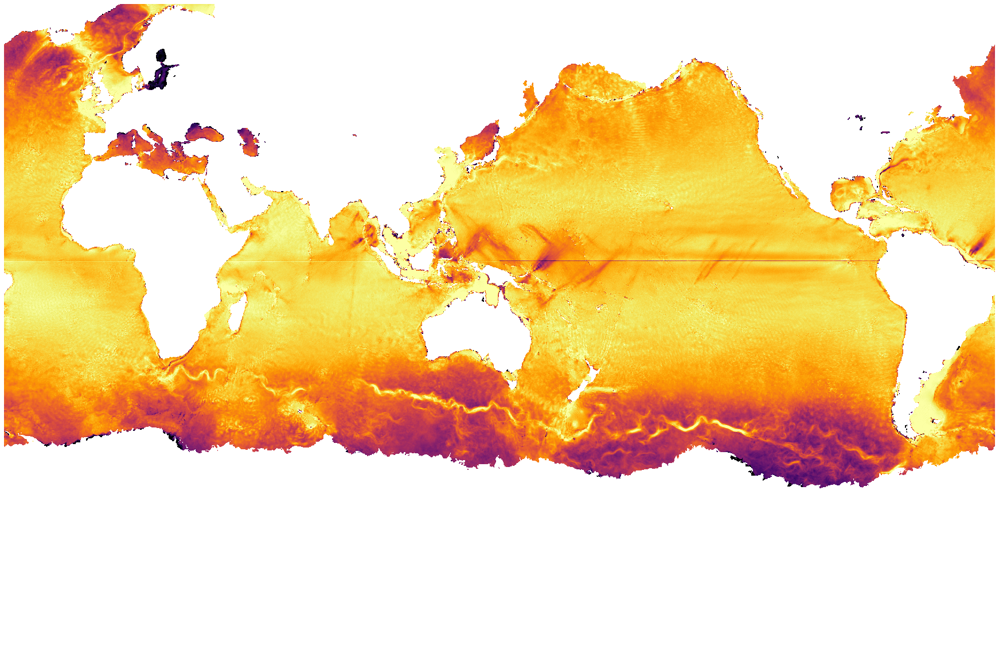

In [28]:
quick_llc_plot(np.log10(ds_omega.E_omega_all.where(ice>0)/E_ageo.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

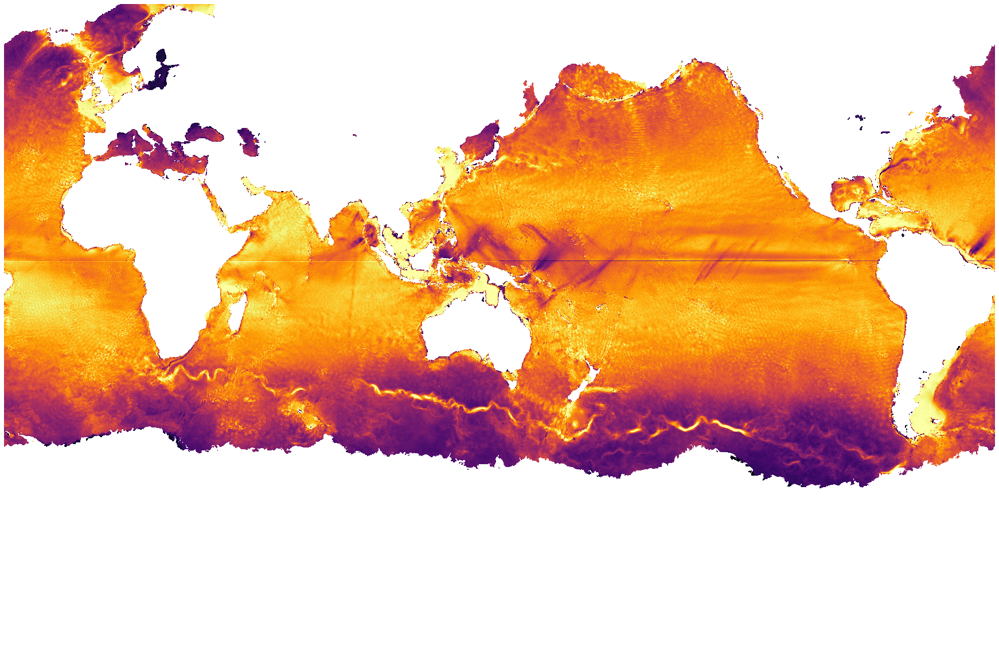

In [29]:
quick_llc_plot((ds_omega.E_omega_all.where(ice>0)/E_ageo.where(ice>0)), vmin= 0, vmax = 1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

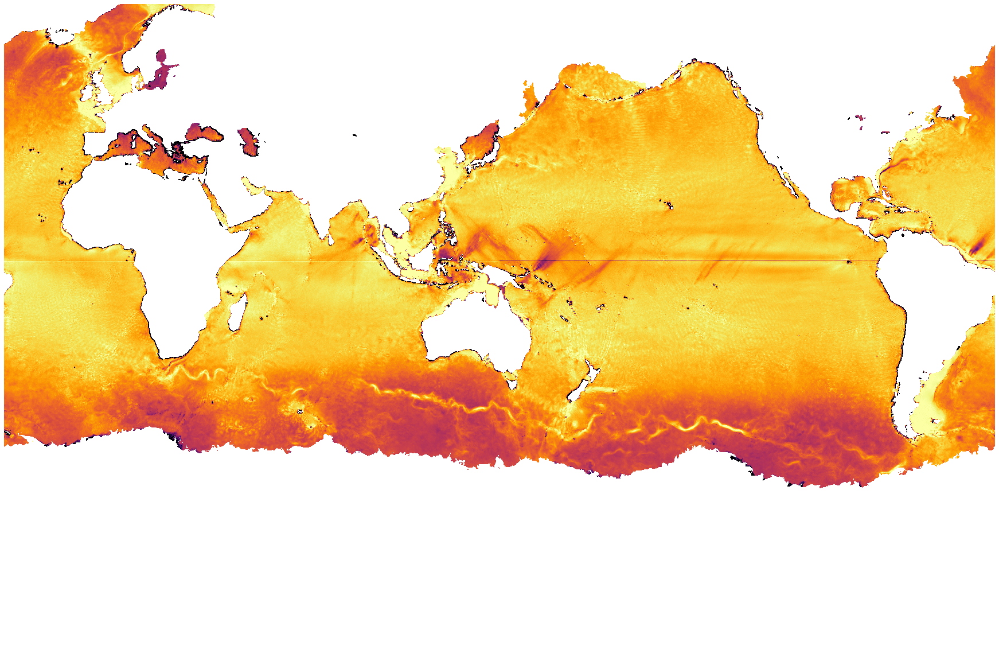

In [25]:
quick_llc_plot(np.log10( (ds_omega.E_omega_all.where(ice>0)+Tau_ELD_rms.where(ice>0)) /E_ageo_all.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

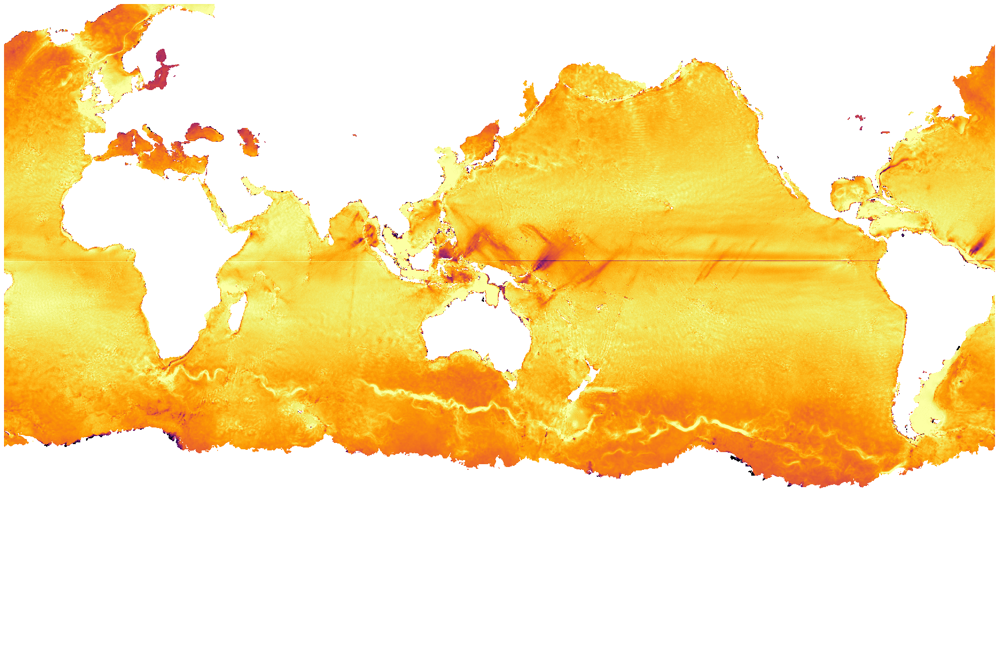

In [26]:
quick_llc_plot(np.log10( (ds_omega.E_omega_all.where(ice>0)+Tau_ELD_rms.where(ice>0)) /E_ageo.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

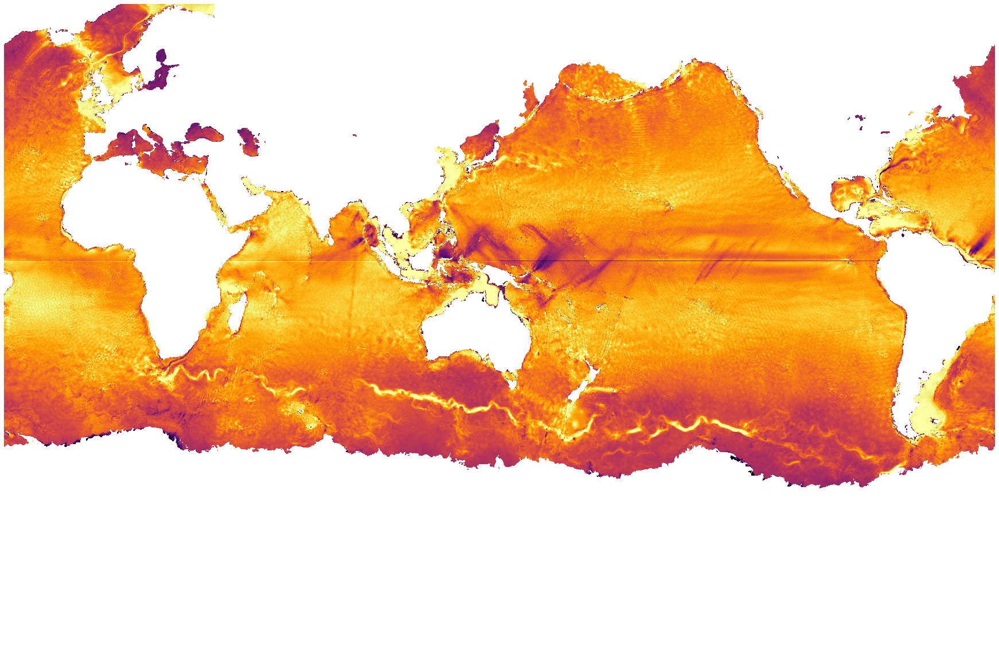

In [29]:
quick_llc_plot( (ds_omega.E_omega_all.where(ice>0)+Tau_ELD_rms.where(ice>0)) /E_ageo.where(ice>0), vmin= 0, vmax = 1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

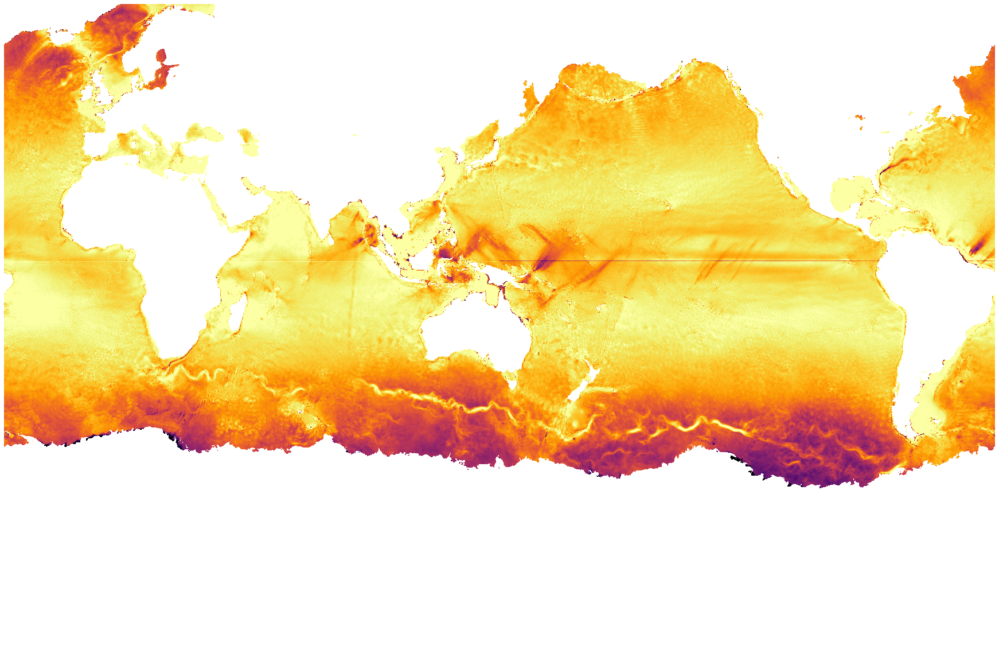

In [27]:
quick_llc_plot(np.log10( (ds_omega.E_omega_all.where(ice>0)+Tau_H_rms.where(ice>0)) /E_ageo.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

In [31]:
cluster.close()